# Рынок заведений общественного питания Москвы

# Описание проекта
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

<a class="anchor" id="toc"></a>
# Оглавление
 - [Шаг 1. Загрузка и изучение данных](#description)
 - [Шаг 2. Предобработка данных](#eda)
 - [Шаг 3. Анализ данных](#research)
 - [Шаг 4. Детализируем исследование: открытие кофейни](#details)

<a class="anchor" id="description"></a>
# Шаг 1. Загрузка и изучение данных

[К оглавлению](#toc)

In [1]:
!pip install geopy

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
from geopy.distance import geodesic

path = '/datasets/moscow_places.csv'
df = pd.read_csv(path)
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [5]:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [6]:
len(df['hours'].unique())

1308

In [7]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [8]:
print("Доля значений, где не указана средняя цена чашки кофе: ", format(df['middle_coffee_cup'].isna().sum() / len(df['middle_coffee_cup']), ".0%"))
print("Доля значений категории кофейня, где не указана средняя цена чашки кофе: ", format(df[df['category'] == 'кофейня']['middle_coffee_cup'].isna().sum() / len(df['middle_coffee_cup']), ".0%"))

Доля значений, где не указана средняя цена чашки кофе:  94%
Доля значений категории кофейня, где не указана средняя цена чашки кофе:  11%


In [9]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


### Вывод:
1) Данные содержат 13 столбцов, в столбце hours с графиком работы есть графики не всех заведений, значения price, avg_bill и middle_avg_bill есть для менее половины заведений, средняя цена чашки кофе (middle_coffee_cup) указана лишь для небольшого числа заведений, большая часть из которых это кофейни). Число посадочных мест указано для почти половины строк.
2) Из столбцов с расписанием работы и средним чеком нужно будет вытаскивать числовые значения, потому что эти столбцы представлены строками, и нужные значения указаны внутри них. Вариантов указания расписания 1308.

<a class="anchor" id="eda"></a>
# Шаг 2. Предобработка данных

[К оглавлению](#toc)

### Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [10]:
df[(df.duplicated(['name'])) & (df['chain']==0)].sort_values(by='name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6491,Бистро,быстрое питание,"Москва, Люблинская улица, 10с4",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.701253,37.732078,3.6,NaN,NaN,NaN,NaN,0,NaN
3061,Бистро,кафе,"Москва, улица Академика Павлова, 50",Западный административный округ,"ежедневно, 08:00–22:00",55.746732,37.408989,3.6,NaN,NaN,NaN,NaN,0,NaN
1204,Бистро,кафе,"Москва, Северо-Западный административный округ...",Северо-Западный административный округ,"ежедневно, 10:00–20:30",55.797477,37.412280,4.9,NaN,NaN,NaN,NaN,0,NaN
7260,Бистро,булочная,"Москва, Ереванская улица, 28, корп. 1",Южный административный округ,"ежедневно, круглосуточно",55.627945,37.678431,4.1,NaN,NaN,NaN,NaN,0,240.0
5999,Бистро,кафе,"Москва, улица Доватора, 13, стр. 2",Центральный административный округ,"ежедневно, 10:00–22:00",55.722877,37.566943,4.3,средние,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5548,Шашлычная,кафе,"Москва, Авиамоторная улица, 39",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.755822,37.716738,3.8,NaN,NaN,NaN,NaN,0,NaN
2898,Шашлычная,кафе,"Москва, Народный проспект, 17к1с10",Восточный административный округ,"ежедневно, 10:00–22:00",55.784637,37.752144,4.2,NaN,NaN,NaN,NaN,0,NaN
6516,Шашлычная,кафе,"Москва, Заозёрная улица, 14",Восточный административный округ,"ежедневно, 09:00–21:00",55.716498,37.847963,4.4,NaN,NaN,NaN,NaN,0,NaN
5930,Шашлычная,кафе,"Москва, улица Вавилова, 5, стр. 6",Южный административный округ,"ежедневно, 10:00–22:00",55.705436,37.589052,4.3,средние,Средний счёт:300–600 ₽,450.0,NaN,0,NaN


In [11]:
df_lower = df.assign(name=df['name'].str.lower(), address=df['address'].str.lower())
df[df_lower.duplicated(['name', 'address'])].index

Int64Index([215, 1511, 2420, 3109], dtype='int64')

In [12]:
df_lower = df.assign(name=df['name'].str.lower(), address=df['address'].str.lower())
duplicate_indices = df[df_lower.duplicated(['name', 'address'])].index
df = df.drop(duplicate_indices)

df[df_lower.duplicated(['name', 'address'])].index

/tmp/ipykernel_111/2579194281.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[df_lower.duplicated(['name', 'address'])].index


Int64Index([], dtype='int64')

In [13]:
df.iloc[215]

name                                       Грузинский бульвар
category                                      быстрое питание
address              Москва, Дмитровское шоссе, 163А, корп. 1
district              Северо-Восточный административный округ
hours                                  ежедневно, 10:00–22:00
lat                                                 55.909115
lng                                                 37.540112
rating                                                    4.0
price                                                     NaN
avg_bill                                                  NaN
middle_avg_bill                                           NaN
middle_coffee_cup                                         NaN
chain                                                       0
seats                                                   350.0
Name: 216, dtype: object

Есть базовые названия, которые дублируются, но заведения имеют разные адреса.

In [14]:
df.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063675
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605451
avg_bill             0.545822
middle_avg_bill      0.625208
middle_coffee_cup    0.936325
chain                0.000000
seats                0.429660
dtype: float64

Не заполняем пропуски, так как в этом нет надобности - числовые значения лучше не заполнять, а столбец price нигде не используется.

In [15]:
df['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [16]:
df['street'] = df['address'].str.split(',').str[1].str.strip()
mask = df['street'].str.contains('округ')
df.loc[mask, 'street'] = None
df['street'].unique()

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

In [17]:
df.iloc[1204]

name                                 Ginger Cafe&FitnessBar
category                                               кафе
address                 Москва, улица Кулакова, 20, корп. 1
district             Северо-Западный административный округ
hours                                ежедневно, 09:00–23:00
lat                                               55.803043
lng                                               37.389885
rating                                                  4.2
price                                                   NaN
avg_bill                                                NaN
middle_avg_bill                                         NaN
middle_coffee_cup                                       NaN
chain                                                     0
seats                                                 239.0
street                                       улица Кулакова
Name: 1205, dtype: object

In [18]:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [19]:
df[df['hours'].str.split(',').str[0].str.strip() == 'ежедневно']['hours'].unique()

array(['ежедневно, 10:00–22:00', 'ежедневно, 09:00–22:00',
       'ежедневно, 10:00–23:00', 'ежедневно, 12:00–00:00',
       'ежедневно, круглосуточно', 'ежедневно, 10:00–21:00',
       'ежедневно, 08:00–22:00', 'ежедневно, 13:00–00:00',
       'ежедневно, 09:00–21:00', 'ежедневно, 10:00–19:00',
       'ежедневно, 08:00–21:00', 'ежедневно, 09:00–23:00',
       'ежедневно, 08:00–23:00', 'ежедневно, 11:00–00:00',
       'ежедневно, 09:00–02:00', 'ежедневно, 12:00–23:00',
       'ежедневно, 12:00–03:00', 'ежедневно, 16:00–06:00',
       'ежедневно, 09:00–01:00', 'ежедневно, 11:00–23:00',
       'ежедневно, 09:00–06:00', 'ежедневно, 10:00–21:30',
       'ежедневно, 08:00–00:00', 'ежедневно, 06:00–20:00',
       'ежедневно, 10:00–20:00', 'ежедневно, 11:00–22:00',
       'ежедневно, 10:30–23:00', 'ежедневно, 07:00–00:00',
       'ежедневно, 10:00–22:00, перерыв 16:00–16:20',
       'ежедневно, 13:00–04:00', 'ежедневно, 11:00–19:00',
       'ежедневно, 16:00–04:00', 'ежедневно, 09:00–00:00',


In [20]:
df[df['hours'].str.split(',').str[1].str.strip() == 'круглосуточно']['hours'].unique()

array(['ежедневно, круглосуточно'], dtype=object)

Других вариантов проставления ежедневной и круглосуточной работы нет, ставим по конкретной строке

In [21]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

<a class="anchor" id="research"></a>
# Шаг 3. Анализ данных

[К оглавлению](#toc)

In [22]:
colors = ['#4285f4', '#ff9900']
color = colors[0]

### Какие категории заведений представлены в данных?

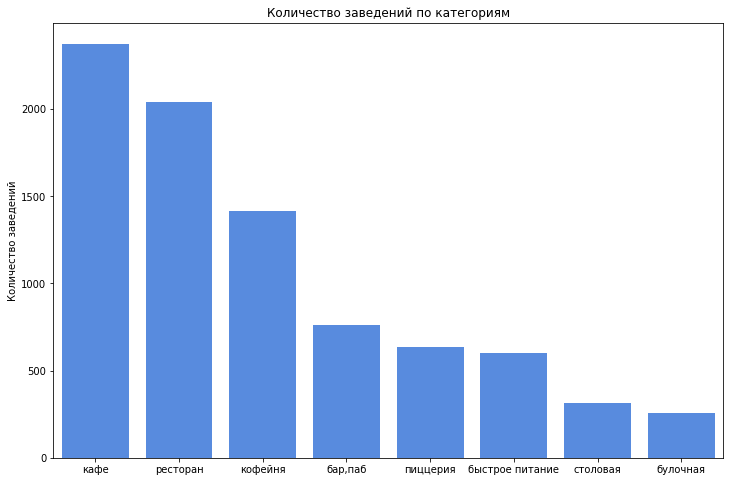

In [23]:
category_counts = df['category'].value_counts().reset_index()
category_counts.columns = ['category', 'count']

plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='count', data=category_counts, color=color, alpha=1)
plt.title('Количество заведений по категориям')
plt.xlabel('')
plt.ylabel('Количество заведений')
plt.show()

В данных больше всего кафе, ресторанов и кофеен

### Сколько посадочных мест в местах по категориям?

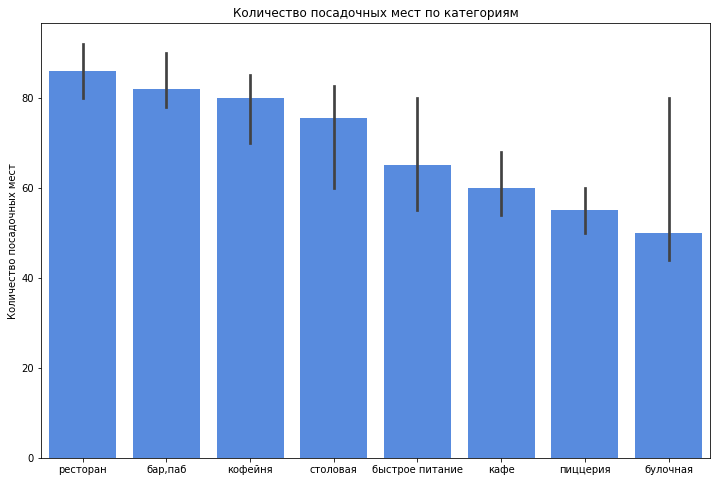

In [24]:
median_seats = df.groupby('category')['seats'].median().reset_index()
median_seats.columns = ['category', 'median_seats']

df_seats = df.merge(median_seats, on='category').sort_values(by='median_seats', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='seats', data=df_seats, color=color, alpha=1, estimator=lambda x: np.median(x))
plt.title('Количество посадочных мест по категориям')
plt.xlabel('')
plt.ylabel('Количество посадочных мест')

plt.show()

В среднем количество посадочных мест варьируется от 50 до 90. Больше всего посадочных мест в ресторанах и барах, меньше всего в булочных.

### Рассмотрим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

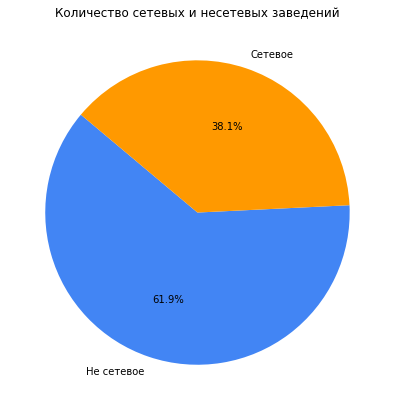

In [25]:
chain_counts = df['chain'].value_counts().reset_index()
chain_counts.columns = ['chain', 'count']

labels = ['Не сетевое', 'Сетевое']

plt.figure(figsize=(10, 7))
plt.pie(chain_counts['count'], labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Количество сетевых и несетевых заведений')
plt.show()

Сетевых заведений больше (68%).

### Какие категории заведений чаще являются сетевыми?

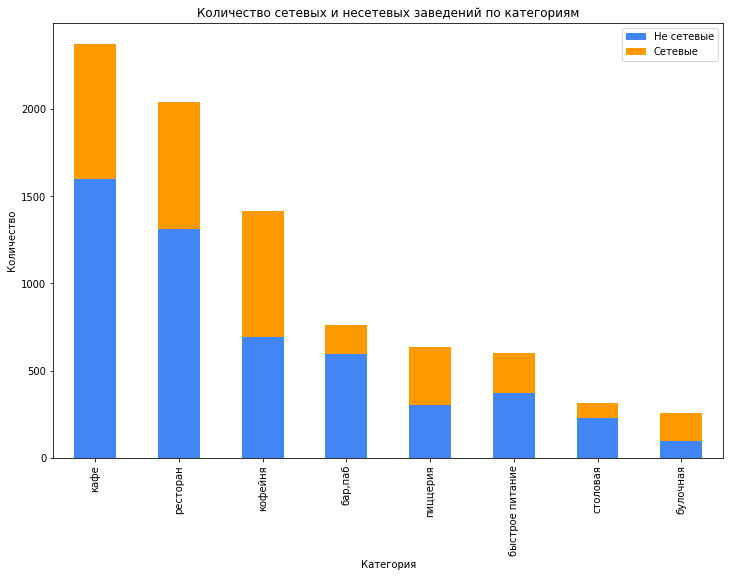

In [26]:
chain_category_counts = df.groupby(['category', 'chain'])[['category', 'chain']].size().reset_index()
chain_category_counts.columns = ['category', 'chain', 'count']
chain_category_counts = chain_category_counts.pivot(index='category', columns='chain', values='count').fillna(0)
chain_category_counts['total'] = chain_category_counts.sum(axis=1)
chain_category_counts = chain_category_counts.sort_values(by='total', ascending=False).drop(columns='total')

chain_category_counts.plot(kind='bar', stacked=True, color=colors, figsize=(12, 8))
plt.title('Количество сетевых и несетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.legend(['Не сетевые', 'Сетевые'])
plt.show()

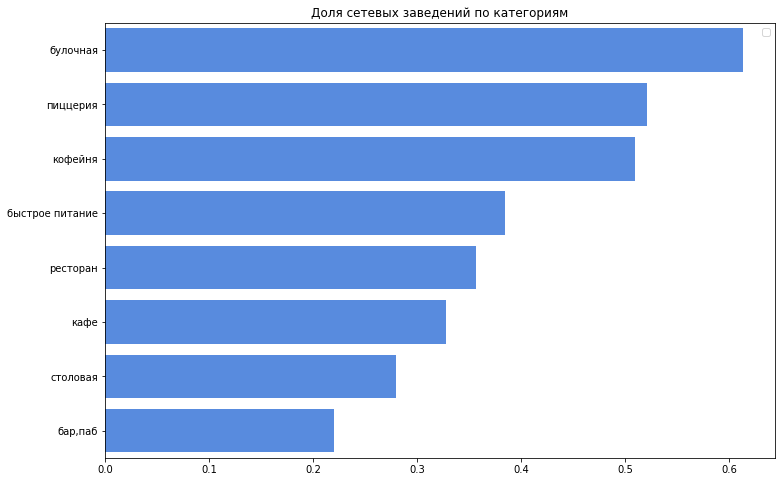

In [27]:
chain_category_counts = chain_category_counts.reset_index()
chain_category_counts.columns=['category', 'single', 'chain']
chain_category_counts['share_chain'] = (chain_category_counts['chain'] /
                                        (chain_category_counts['chain'] +
                                         chain_category_counts['single']))
chain_category_counts = chain_category_counts.sort_values(by='share_chain', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='share_chain', y='category', data=chain_category_counts, color=color, alpha=1)
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('')
plt.ylabel('')
plt.legend('')
plt.show()

Кофейни, пиццерии и булочные чаще бывают сетевыми. Бары, пабы и столовые реже бывают сетевыми.

### Какие сети заведений общепита в Москве самые крупные?

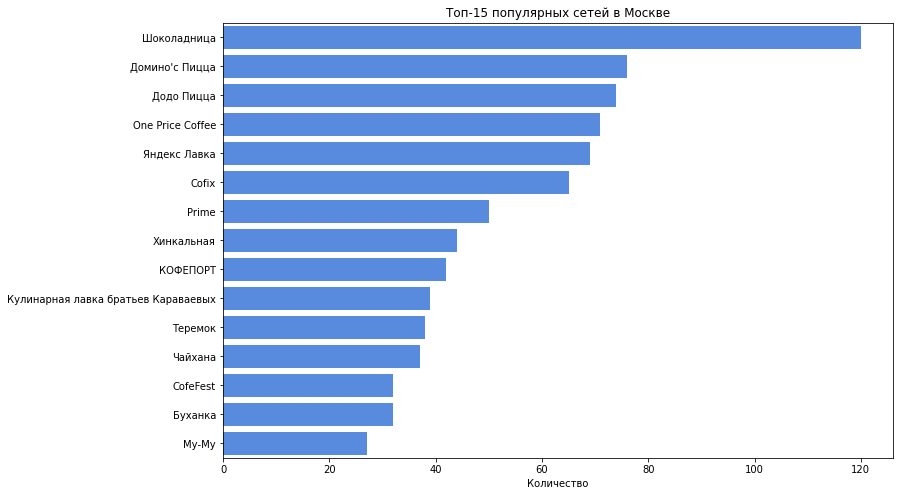

In [28]:
top_15_names = (df[df['chain'] == 1]
                .groupby('name')
                .size()
                .reset_index(name='count')
                .sort_values(by='count', ascending=False)
                .head(15))

plt.figure(figsize=(12, 8))
sns.barplot(x='count', y='name', data=top_15_names, color=color, alpha=1)
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество')
plt.ylabel('')
plt.show()

In [29]:
df_chains = df[df['name'].isin(top_15_names['name'].to_list())][['name', 'category']]
df_chains

,name,category
13,Буханка,булочная
23,Буханка,булочная
32,Додо Пицца,пиццерия
34,Домино'с Пицца,пиццерия
46,CofeFest,кофейня
...,...,...
7973,Теремок,ресторан
7974,Хинкальная,ресторан
7979,Яндекс Лавка,ресторан
7980,Яндекс Лавка,ресторан


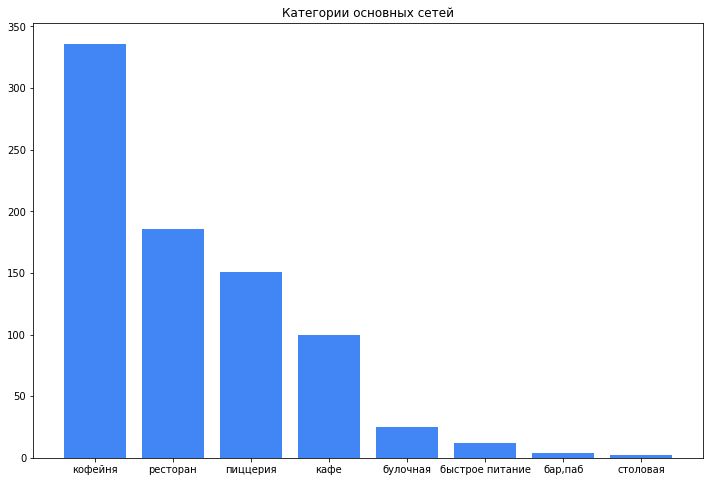

In [30]:
category_counts = df_chains.groupby('category').count().reset_index().sort_values(by='name', ascending=False)

plt.figure(figsize=(12, 8))
plt.bar(category_counts['category'], category_counts['name'], color=color, alpha=1)
plt.title('Категории основных сетей')
plt.xlabel('')
plt.ylabel('')
plt.show()

Сетевые заведения занимают несколько категорий (из-за того, что разные френчайзи могут иметь отличающиеся заведения). Шоколадница, в зависимости от места, может быть кафе, а может быть маленькой кофейней навынос. Больше всего в списке кофеен и кафе.

### Как заведения общепита разделены по административным районам Москвы?

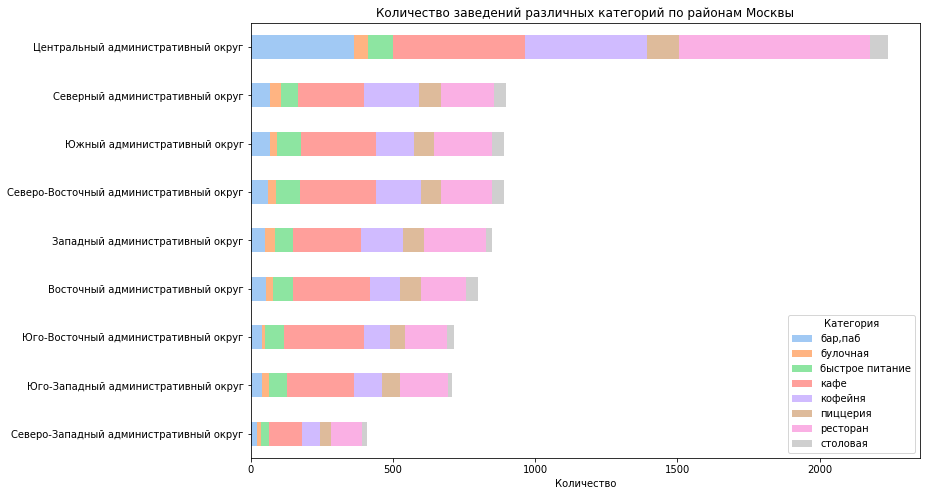

In [31]:
district_category_counts = df.groupby(['category', 'district'])[['category', 'district']].size().reset_index()
district_category_counts.columns = ['category', 'district', 'count']
district_category_counts = district_category_counts.pivot(index='district', columns='category', values='count').fillna(0)
district_category_counts['total'] = district_category_counts.sum(axis=1)
district_category_counts = district_category_counts.sort_values(by='total', ascending=True).drop(columns='total')

colors = sns.color_palette('pastel')

district_category_counts.plot(kind='barh', stacked=True, color=colors, figsize=(12, 8))
plt.title('Количество заведений различных категорий по районам Москвы')
plt.xlabel('Количество')
plt.ylabel('')

plt.legend(title='Категория', loc='lower right')

plt.show()

Больше всего заведений в ЦАО, причём, особенно много в нем ресторанов - их доля выше, чем в остальных районах

### Сильно ли различаются усреднённые рейтинги в разных типах общепита?

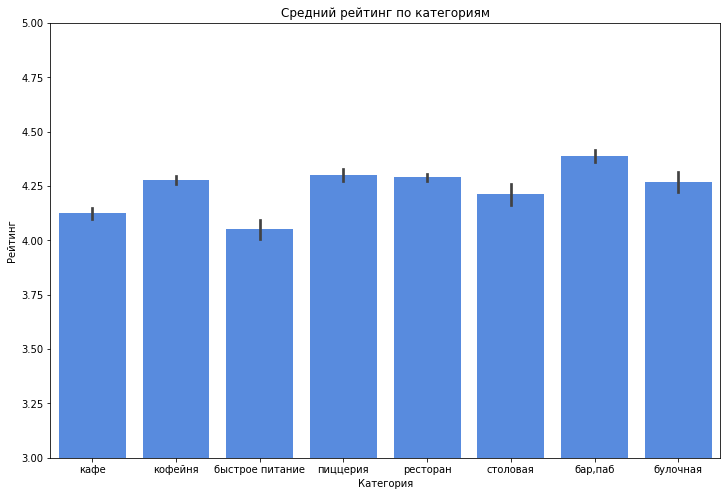

In [32]:
df_sorted = df.sort_values(by='rating', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='rating', data=df_sorted, color=color, alpha=1)
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.ylim(3, 5)
plt.show()

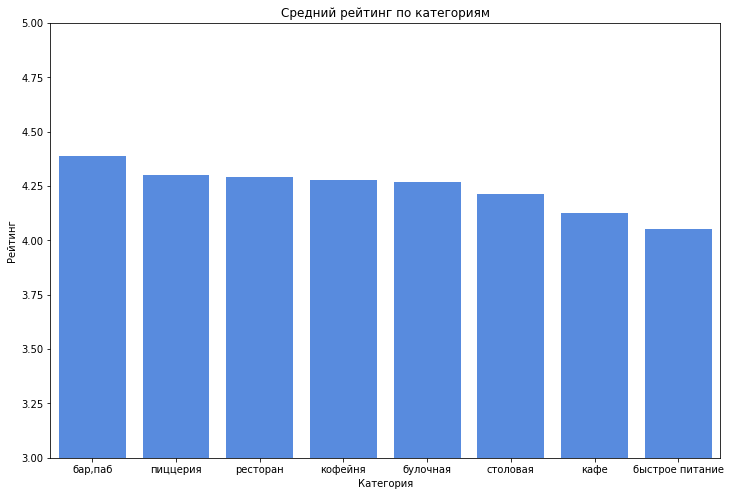

In [33]:
mean_ratings = df.groupby('category')['rating'].mean().reset_index()
mean_ratings.columns = ['category', 'rating']
mean_ratings = mean_ratings.sort_values(by='rating', ascending=False)

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='rating', data=mean_ratings, color=color, alpha=1)
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.ylim(3, 5)
plt.show()

Рейтинги заведений отличаются слабо, выбивается лишь категория быстрого питания, где рейтинг в среднем ниже

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [34]:
rating_df = (df.groupby('district')
                .agg({'rating':'mean'})
                .reset_index()
                .sort_values(by='rating', ascending=False))
rating_df

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240980
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


In [35]:
with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    state_geo = json.load(f)

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг у заведений в Центральном административном округе, самый низкий - у заведений в Юго-восточном административном округе.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [36]:
# Пересоздадим карту, чтобы избежать наложения точек на хороплет
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

### На каких улицах больше всего заведений общепита?

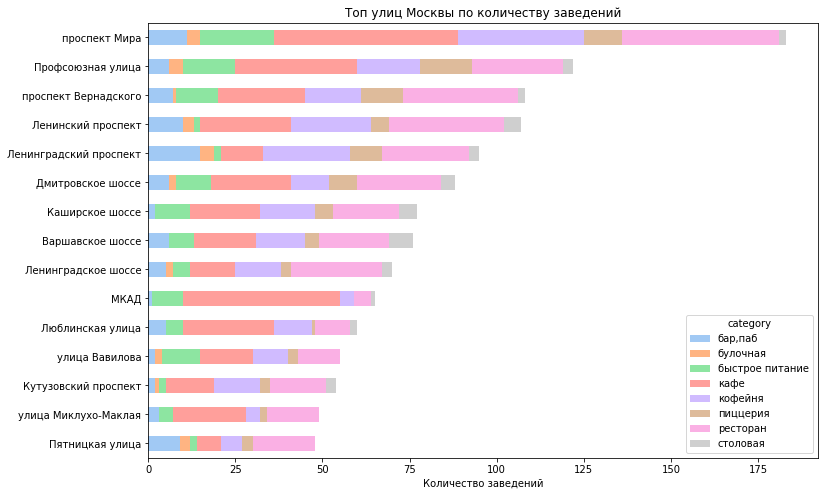

In [37]:
top_15_streets = (df.groupby('street')
                .size()
                .reset_index(name='total')
                .sort_values(by='total', ascending=False)
                .head(15))

street_category_counts = df.groupby(['category', 'street'])[['category', 'street']].size().reset_index()
street_category_counts.columns = ['category', 'street', 'count']

street_category_counts = street_category_counts.merge(top_15_streets, how='inner', on='street')
street_category_counts = street_category_counts.pivot(index='street', columns='category', values='count').fillna(0)
street_category_counts['total'] = street_category_counts.sum(axis=1)
street_category_counts = street_category_counts.sort_values(by='total', ascending=True).drop(columns='total')
colors = sns.color_palette('pastel')

street_category_counts.plot(kind='barh', stacked=True, color=colors, figsize=(12, 8))
plt.title('Топ улиц Москвы по количеству заведений')
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.show()

Больше всего заведений находится на Проспекте Мира, особенно много ресторанов и кафе.

### На каких улицах есть только одно заведение общепита?

In [38]:
one_cafe_streets = (df.groupby('street')
                .size()
                .reset_index(name='total')
                .sort_values(by='total', ascending=False))
one_cafe_streets = one_cafe_streets[one_cafe_streets['total']==1]

one_cafe_streets = one_cafe_streets.merge(df, how='inner', on='street')
one_cafe_streets['category'].value_counts()

кафе               159
ресторан            94
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

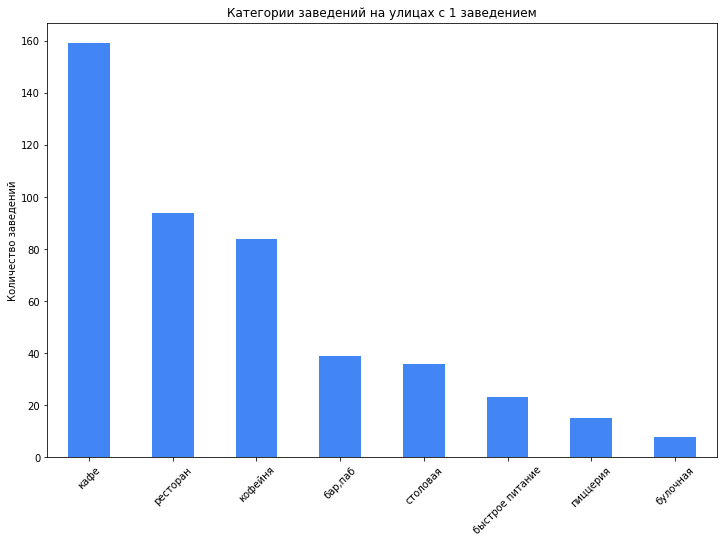

In [39]:
category_counts = one_cafe_streets['category'].value_counts()

plt.figure(figsize=(12, 8))
category_counts.plot(kind='bar', color=color, alpha=1)
plt.title('Категории заведений на улицах с 1 заведением')
plt.xlabel('')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

In [40]:
one_cafe_streets['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             53
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         17
Name: district, dtype: int64

In [41]:
one_cafe_streets['rating'].mean()

4.234934497816593

In [42]:
one_cafe_streets['chain'].mean()

0.2903930131004367

In [43]:
one_cafe_streets['seats'].median()

45.0

In [44]:
df['seats'].median()

75.0

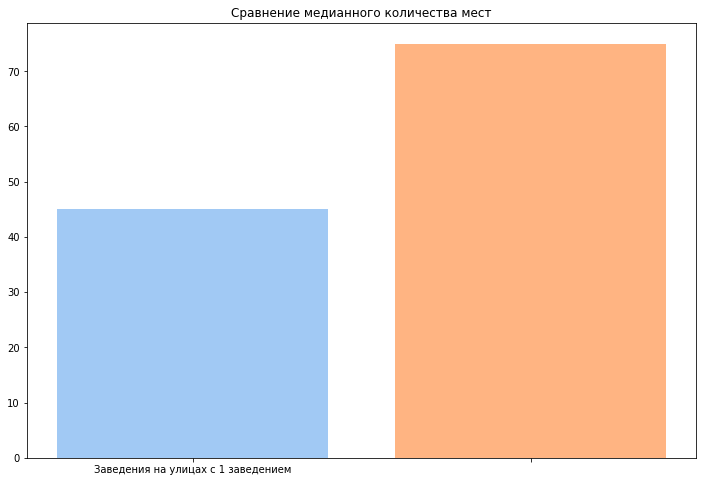

In [45]:
median_data = pd.DataFrame({
    'Тип': ['Заведения на улицах с 1 заведением', ''],
    'Количество мест': [one_cafe_streets['seats'].median(), df['seats'].median()]
})

plt.figure(figsize=(12, 8))
plt.bar(median_data['Тип'], median_data['Количество мест'], color=colors, alpha=1)
plt.title('Сравнение медианного количества мест')
plt.xlabel('')
plt.ylabel('')
plt.show()

На улицах, где есть только одно заведение, как правило находятся кафе. Чаще всего такие улицы находятся в ЦАО. Рейтинг и доля сетевых заведений на таких улицах не отличается, но среднее количество посадочных мест сильно меньше среднего значения в 95 мест.

### Как удалённость от центра влияет на цены в заведениях?

In [46]:
bill_df = (df.groupby('district')
                .agg({'middle_avg_bill':'median'})
                .reset_index()
                .sort_values(by='middle_avg_bill', ascending=False))
bill_df

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [47]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

m

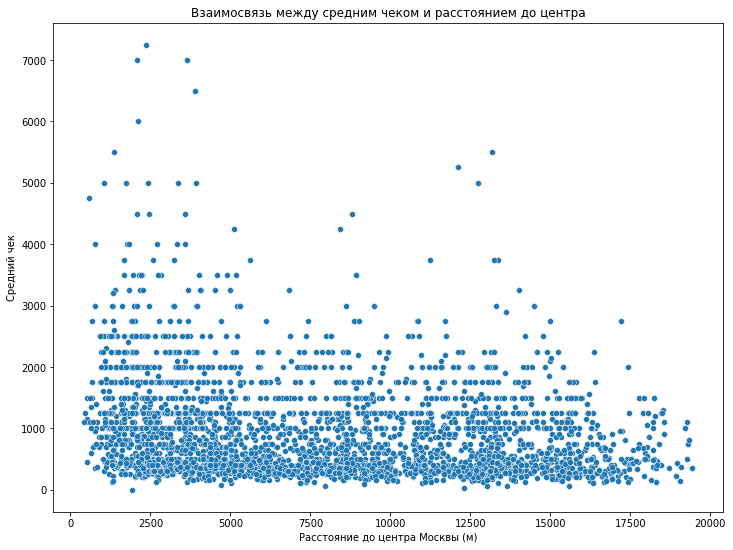

In [48]:
df['distance_to_center'] = df.apply(lambda row: geodesic((moscow_lat, moscow_lng), (row['lat'], row['lng'])).meters, axis=1)

plt.figure(figsize=(12, 9))
sns.scatterplot(x='distance_to_center', y='middle_avg_bill', data=df[df['middle_avg_bill']<10000])
plt.title('Взаимосвязь между средним чеком и расстоянием до центра')
plt.xlabel('Расстояние до центра Москвы (м)')
plt.ylabel('Средний чек')
plt.show()

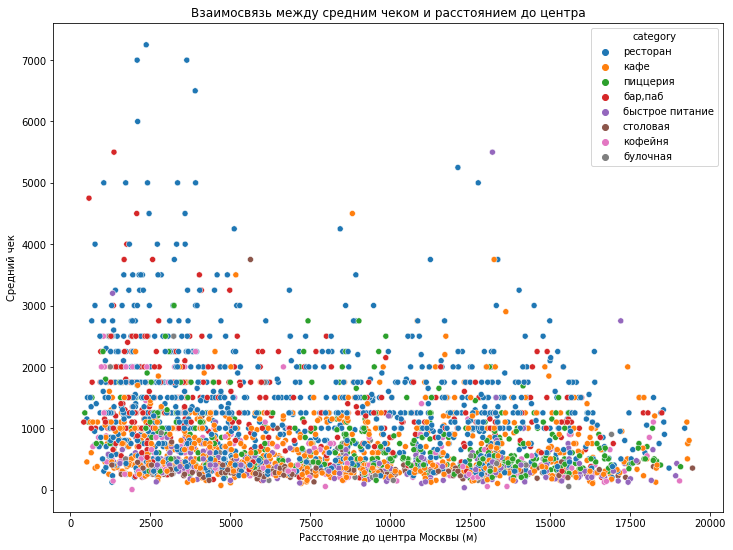

In [49]:
df['distance_to_center'] = df.apply(lambda row: geodesic((moscow_lat, moscow_lng), (row['lat'], row['lng'])).meters, axis=1)

plt.figure(figsize=(12, 9))
sns.scatterplot(x='distance_to_center', y='middle_avg_bill', data=df[df['middle_avg_bill']<10000], hue='category')
plt.title('Взаимосвязь между средним чеком и расстоянием до центра')
plt.xlabel('Расстояние до центра Москвы (м)')
plt.ylabel('Средний чек')
plt.show()

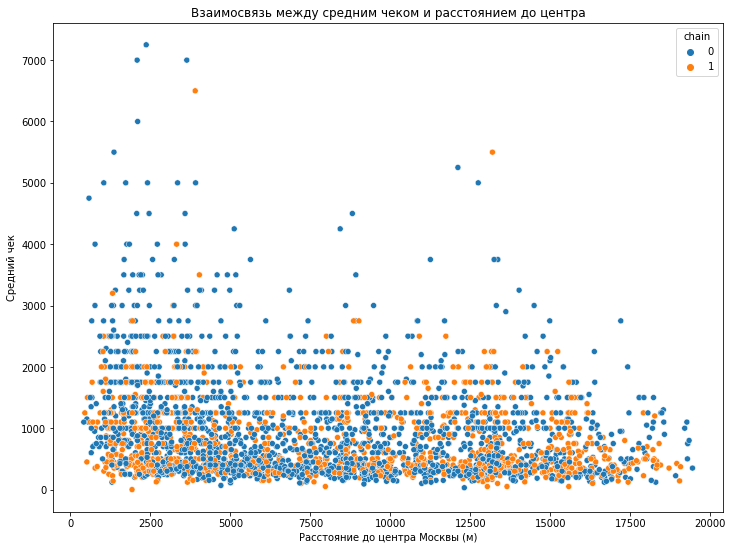

In [50]:
df['distance_to_center'] = df.apply(lambda row: geodesic((moscow_lat, moscow_lng), (row['lat'], row['lng'])).meters, axis=1)

plt.figure(figsize=(12, 9))
sns.scatterplot(x='distance_to_center', y='middle_avg_bill', data=df[df['middle_avg_bill']<10000], hue='chain')
plt.title('Взаимосвязь между средним чеком и расстоянием до центра')
plt.xlabel('Расстояние до центра Москвы (м)')
plt.ylabel('Средний чек')
plt.show()

Средний чек в Центральном административном округе и средний чек в Юго-восточном административном округе отличаются более, чем в два раза. Для ресторанов и баров есть взаимосвязь с удалением заведения от центра, но она не наблюсдается в других видах заведений. Для сетевых заведений эта взаимосвязь также ниже.

### Как отличается среднее количество посадочных мест по районам?

In [51]:
seats_df = (df.groupby('district')
                .agg({'seats':'mean'})
                .reset_index()
                .sort_values(by='seats', ascending=False))
seats_df

,district,seats
1,Западный административный округ,155.054507
5,Центральный административный округ,122.041596
8,Южный административный округ,109.917108
2,Северный административный округ,106.553082
3,Северо-Восточный административный округ,98.710317
4,Северо-Западный административный округ,95.932331
7,Юго-Западный административный округ,85.285714
0,Восточный административный округ,83.215311
6,Юго-Восточный административный округ,82.091429


In [52]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=seats_df,
    columns=['district', 'seats'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Среднее количество посадочных мест по районам',
).add_to(m)

m

Заведения с самым большим количеством посадочных мест находятся в Западном административном округе, а с самым малым количеством посадочных мест находятся в ЮВАО.

### Выводы
- В данных больше всего кафе, ресторанов и кофеен.
- В среднем количество посадочных мест варьируется от 50 до 90. Больше всего посадочных мест в ресторанах и барах, меньше всего в булочных.
- Сетевых заведений больше (68%).
- Кофейни, пиццерии и булочные чаще бывают сетевыми. Бары, пабы и столовые реже бывают сетевыми.
- Сетевые заведения занимают несколько категорий (из-за того, что разные френчайзи могут иметь отличающиеся заведения). Шоколадница, в зависимости от места, может быть кафе, а может быть маленькой кофейней навынос. Больше всего в списке кофеен и кафе.
- Больше всего заведений в Центральном административном округе, причём, особенно много в нем ресторанов - их доля выше, чем в остальных районах.
- Рейтинги заведений отличаются слабо, выбивается лишь категория быстрого питания, где рейтинг в среднем ниже. 
- Самый высокий рейтинг у заведений в Центральном административном округе, самый низкий - у заведений в Юго-восточном административном округе.
- Больше всего заведений находится на Проспекте Мира, особенно много ресторанов и кафе.
- На улицах, где есть только одно заведение, как правило находятся кафе. Чаще всего такие улицы находятся в ЦАО. Рейтинг и доля сетевых заведений на таких улицах не отличается, но среднее количество посадочных мест сильно меньше среднего значения в 95 мест.
- Средний чек в Центральном административном округе и средний чек в Юго-восточном административном округе отличаются более, чем в два раза. Для ресторанов и баров есть взаимосвязь с удалением заведения от центра, но она не наблюсдается в других видах заведений. Для сетевых заведений эта взаимосвязь также ниже.
- Заведения с самым большим количеством посадочных мест находятся в Западном административном округе, а с самым малым количеством посадочных мест находятся в Юго-восточном административном округе.

<a class="anchor" id="details"></a>
# Шаг 4. Детализируем исследование: открытие кофейни

[К оглавлению](#toc)

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [54]:
df[df['category'] == 'кофейня']['category'].count()

1413

In [55]:
df_coffee = df[df['category'] == 'кофейня']

In [56]:
coffee_by_district_df = (df_coffee.groupby('district')
                .size()
                .reset_index(name='count')
                .sort_values(by='count', ascending=False))

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=coffee_by_district_df,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

m

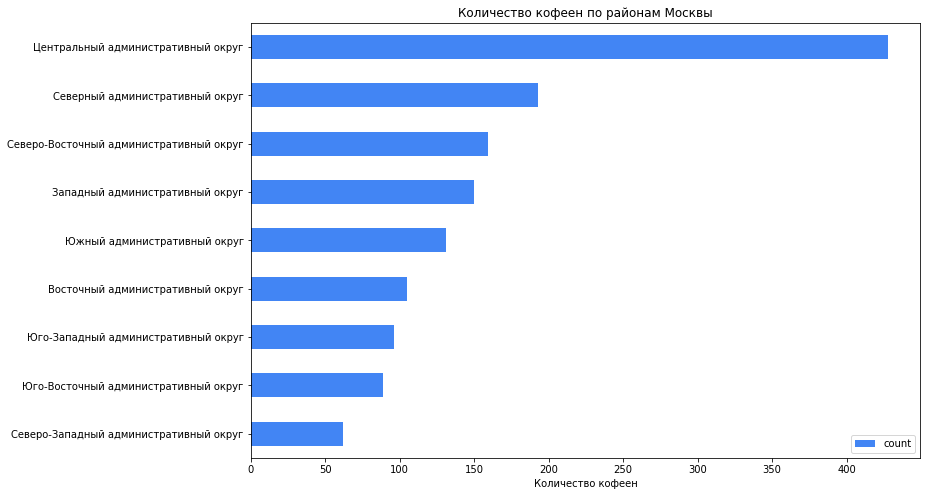

In [57]:
coffee_by_district_df.set_index('district').sort_values(by='count', ascending=True).plot(kind='barh', stacked=True, color=color, figsize=(12, 8))
plt.title('Количество кофеен по районам Москвы')
plt.xlabel('Количество кофеен')
plt.ylabel('')
plt.show()

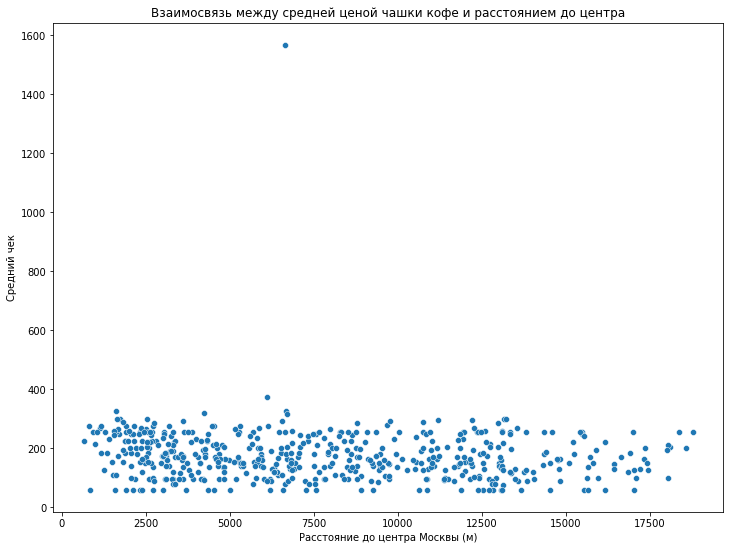

In [58]:
plt.figure(figsize=(12, 9))
sns.scatterplot(x='distance_to_center', y='middle_coffee_cup', data=df_coffee)
plt.title('Взаимосвязь между средней ценой чашки кофе и расстоянием до центра')
plt.xlabel('Расстояние до центра Москвы (м)')
plt.ylabel('Средний чек')
plt.show()

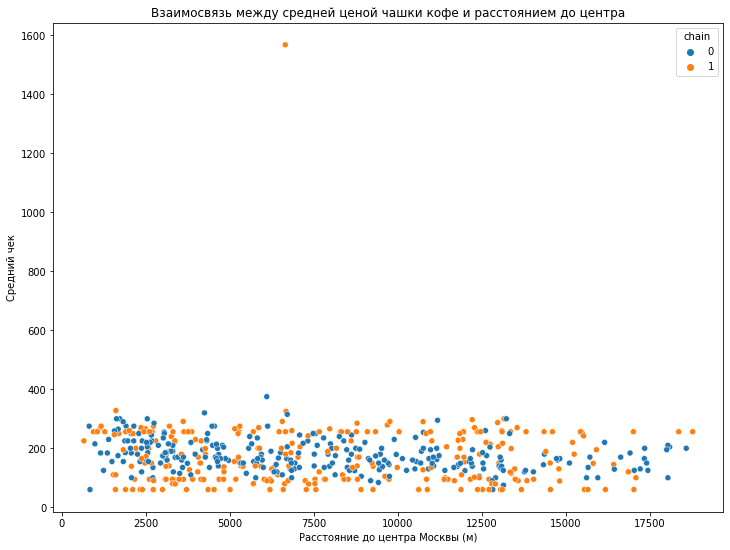

In [59]:
plt.figure(figsize=(12, 9))
sns.scatterplot(x='distance_to_center', y='middle_coffee_cup', data=df_coffee, hue='chain')
plt.title('Взаимосвязь между средней ценой чашки кофе и расстоянием до центра')
plt.xlabel('Расстояние до центра Москвы (м)')
plt.ylabel('Средний чек')
plt.show()

В основном кофейни расположены в центре Москвы, но средний чек не сильно зависит от удаления от центра, вне зависимости от того, сетевая это кофейня или нет.

### Есть ли круглосуточные кофейни?

In [60]:
counts_24_7 = df_coffee['is_24_7'].value_counts().reset_index()
counts_24_7.columns = ['is_24_7', 'count']

counts_24_7

,is_24_7,count
0,False,1339
1,True,59


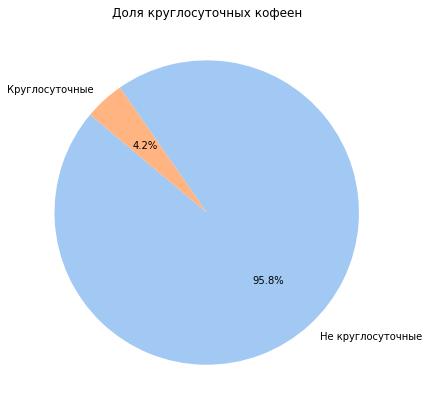

In [61]:
counts_24_7 = df_coffee['is_24_7'].value_counts().reset_index()
counts_24_7.columns = ['is_24_7', 'count']

labels = ['Не круглосуточные', 'Круглосуточные']

plt.figure(figsize=(10, 7))
plt.pie(counts_24_7['count'], labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Доля круглосуточных кофеен')
plt.show()

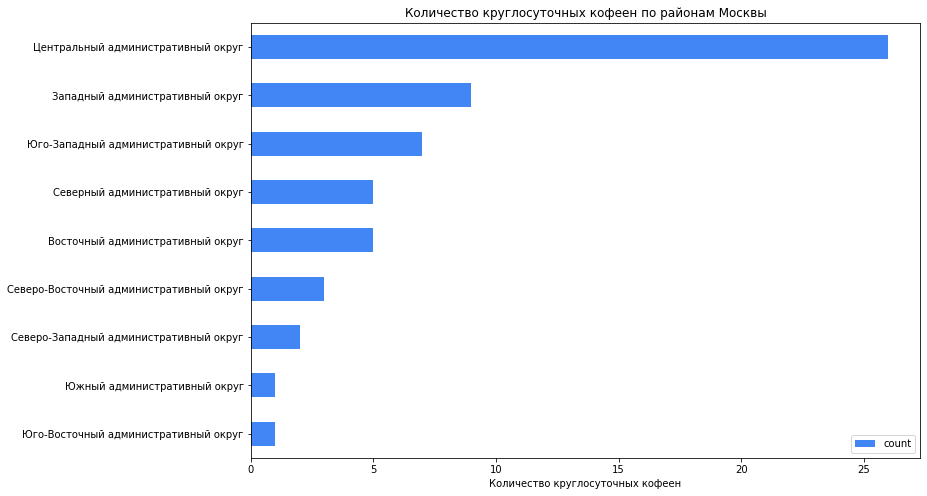

In [62]:
coffee_by_district_df = (df_coffee[df_coffee['is_24_7']==True].groupby('district')
                .size()
                .reset_index(name='count')
                .sort_values(by='count', ascending=False))

coffee_by_district_df.set_index('district').sort_values(by='count', ascending=True).plot(kind='barh', stacked=True, color=color, figsize=(12, 8))
plt.title('Количество круглосуточных кофеен по районам Москвы')
plt.xlabel('Количество круглосуточных кофеен')
plt.ylabel('')
plt.show()

Круглосуточных кофеен в Москве около 4%, около половины из них (25) расположены в Центральном административном округе.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [63]:
rating_df = (df_coffee.groupby('district')
                .agg({'rating':'mean'})
                .reset_index()
                .sort_values(by='rating', ascending=False))
rating_df

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [64]:
coffee_by_district_df = (df_coffee.groupby('district')
                .size()
                .reset_index(name='count')
                .sort_values(by='count', ascending=False))

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по районам',
).add_to(m)

m

Средний рейтинг кофеен по районам отличается не сильно, но самые высокие рейтинги у кофеен в Центральном и Северо-западном административных округах, а самые низкие - в Западном и Северо-восточном административных округах.

### На какую стоимость чашки капучино стоит ориентироваться при открытии кофейни и почему?

In [65]:
df.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24_7', 'distance_to_center'],
      dtype='object')

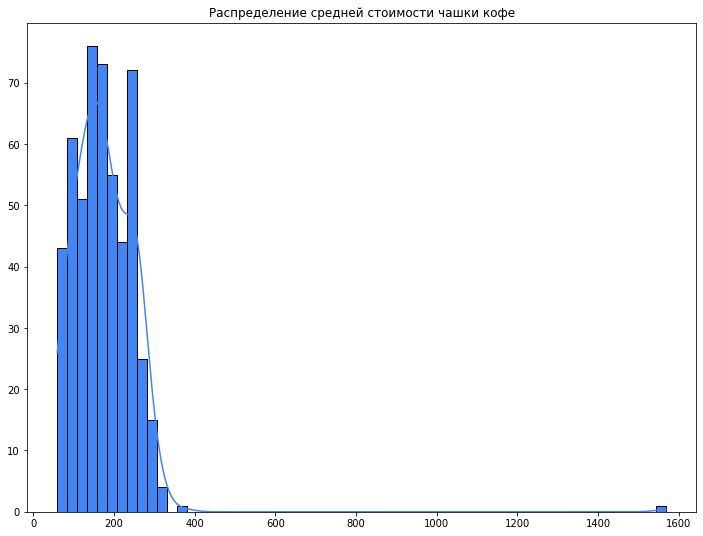

In [66]:
plt.figure(figsize=(12, 9))
sns.histplot(df_coffee['middle_coffee_cup'].dropna(), kde=True, color=color, alpha=1)
plt.title('Распределение средней стоимости чашки кофе')
plt.xlabel('')
plt.ylabel('')
plt.show()

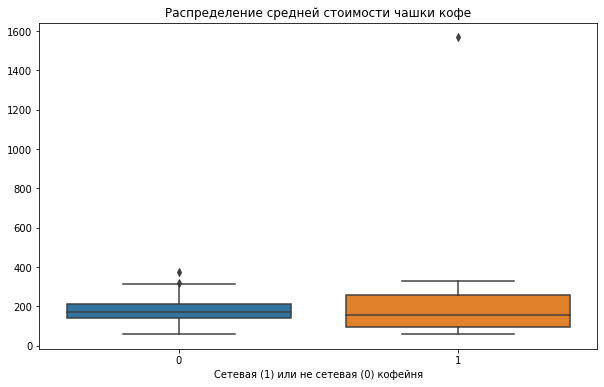

In [67]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='chain', y='middle_coffee_cup', data=df_coffee)
plt.title('Распределение средней стоимости чашки кофе')
plt.xlabel('Сетевая (1) или не сетевая (0) кофейня')
plt.ylabel('')
plt.show()

Средняя стоимость 1 чашки кофе в большинстве кофеен находится в интервале между 199 и 550 рублями. Однако для сетевых кофеен максимальные значения средней цены чашки кофе немного выше.

### Выводы
- В основном кофейни расположены в центре Москвы, но средний чек не сильно зависит от удаления от центра, вне зависимости от того, сетевая это кофейня или нет.
- Круглосуточных кофеен в Москве около 4%, около половины из них (25) расположены в Центральном административном округе.
- Средний рейтинг кофеен по районам отличается не сильно, но самые высокие рейтинги у кофеен в Центральном и Северо-западном административных округах, а самые низкие - в Западном и Северо-восточном административных округах.
- Средняя стоимость 1 чашки кофе в большинстве кофеен находится в интервале между 199 и 550 рублями. Однако для сетевых кофеен максимальные значения средней цены чашки кофе немного выше.

### Рекомендация
Рекомендуется открыть круглосуточную кофейню в Западном административном округе со средним чеком между 199 и 500 рублями.